# Solutions Assignment 6
Authors: Luis Denninger, Leon Herbrik 


## Imports

In [1]:
import torch
import torchgadgets as tg
tg.tools.set_random_seed(42)

import os
from pathlib import Path as P
import numpy as np
import utils
from models import ConvVAE, get_resnet_vae
from tbparse import SummaryReader
from matplotlib.gridspec import GridSpec 

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

from tqdm import tqdm

import matplotlib.pyplot as plt

from torchsummary import summary


from run import *


/home/user/denninge/anaconda3/envs/vision_lab/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Code Structure
This time we tried to bundle all necessary code within the project and only use helper functions from our TorchGadgets package. Since we only present evaluation in this notebook, we provide a short summary of the project directory to (hopefully) easily browse through our code:

        .
        ├── data                    # Holds the dataset
        ├── experiments             # Experiment directory
        │   └── resnet50_vae        # Directory holding the runs of the ResNet50 VAE
        │       ├── run_1           # Directory holding the runs of the convolutional VAE
        │       ├── cond_vae        # Directory holding the runs of the conditional VAE
        │       └── beta_vae        # Directory holding the runs of the beta VAE
        ├── models   
        │   ├── ConvVAE.py          # A simple convolutional VAE with a custom encoder architecture and a mirrored decoder
        │   ├── resnet_vae.py       # VAE model consisting of a ResNet as encoder and decoder (Model used in this project)
        ├── prepare_data.py         # Script to extract the images to tensor files for faster data loading
        ├── run.py                  # File containing everything to train the model (training scripts, loss functions and dataset)
        └── ...

## Dataset
The data loading of large images from .jpg files poses a bottleneck in the training pipeline. We choose to extract the images and save them to PyTorch tensor files after resizing them to our input size 64x64. The script can be found at `prepare_data.py`. This step sped up training by a great factor. During training we only added simple data augmentation techniques such as random horizontal and vertical flips and color jitter.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


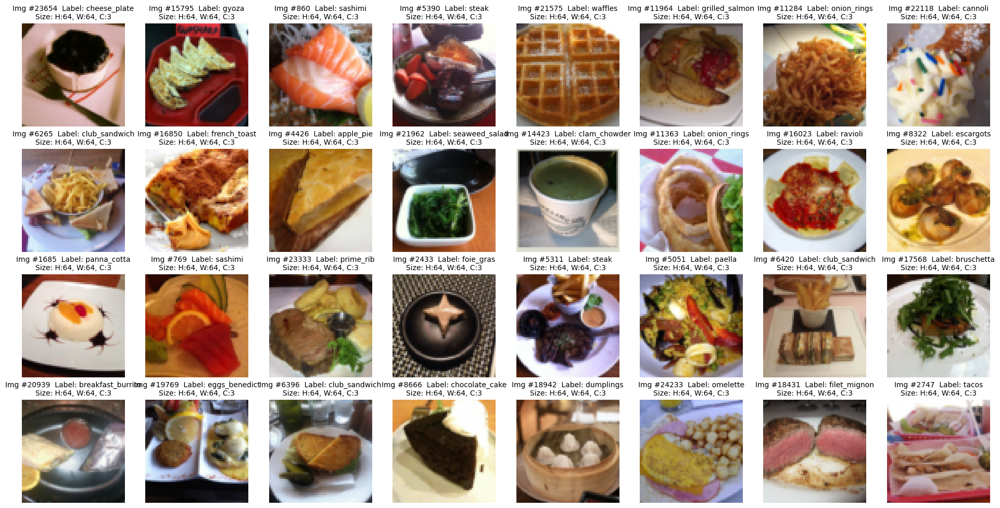

In [2]:
categories = [
    'apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare',
    'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito',
    'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake',
    'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla',
    'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder',
    'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes',
    'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict',
    'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras',
    'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari',
    'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad',
    'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza',
    'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus',
    'ice_cream', 'lasagna',
    'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese',
    'macarons', 'miso_soup', 'mussels', 'nachos', 'omelette', 'onion_rings',
    'oysters', 'pad_thai', 'paella', 'pancakes', 'panna_cotta', 'peking_duck',
    'pho', 'pizza', 'pork_chop', 'poutine', 'prime_rib', 'pulled_pork_sandwich',
    'ramen', 'ravioli', 'red_velvet_cake', 'risotto', 'samosa', 'sashimi',
    'scallops', 'seaweed_salad', 'shrimp_and_grits', 'spaghetti_bolognese',
    'spaghetti_carbonara', 'spring_rolls', 'steak', 'strawberry_shortcake',
    'sushi', 'tacos', 'takoyaki', 'tiramisu', 'tuna_tartare', 'waffles'
]

##-- Load Dataset --##
# Simply load the dataset using TorchGadgets and define our dataset to apply the initial augmentations
train_dataset = Food101Dataset()
test_dataset = Food101Dataset(train_set=False)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True, drop_last=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=True, drop_last=True, num_workers=2)

data_augmentor = tg.data.ImageDataAugmentor(config=[{
            "type": "normalize",
            "train": True,
            "eval": True
        }])

fig = tg.visualization.visualize_dataset(test_dataset, label_names=categories, layout=(4,8) )

## Convolutional VAE

We experimented with different custom encoder and decoder architectures. For this we implemented a convolutional VAE that can be found in `models/ConvVAE.py`. We did not achieve good results, the models could barely reconstruct the contours of the foreground object. Finally, we switched over to using a VAE consisting of a pre-trained ResNet-50 encoder and a mirrored version of the ResNet-50 as the decoder. For this we adapted an implementation from: https://github.com/julianstastny/VAE-ResNet18-PyTorch. We changed the VAE structure a bit and added inverse bottleneck blocks such that we can also use larger ResNet architectures such as the ResNet-50. The code can be found in `models/resnet_vae.py`. All functions to train and evaluate the model, the different loss functions and the dataset can be found in `run.py`.

### Model Parameters

<b>Architecture</b>: ResNet-50 encoder & decoder <br/>
<b>Input size</b>: 64 x 64 <br/>
<b>Batch size</b>: 64 <br/>
<b>Optimizer</b>: Adam <br/>
<b>Learning rate</b>: 1e-4 <br/>
<b>Loss</b>: Mean Squared error with KL-divergence and LPIPS regularization <br/>
<b>KL-divergence weight</b>: 1e-4 <br/>
<b>LPIPS weight</b>: 0.01 <br/>
<b>Epochs</b>: 40 <br/>


In [3]:
convVAE_exp_name = 'resnet50_vae'
convVAE_run_name = 'run_1'
checkpoint = 40

log_dir = P(os.getcwd(), 'experiments', convVAE_exp_name, convVAE_run_name, 'logs')

config = utils.load_config_from_run(convVAE_exp_name, convVAE_run_name)
config['num_iterations'] = config['dataset']['train_size'] // config['batch_size']
config['num_eval_iterations'] = config['dataset']['test_size'] // config['batch_size']

conv_model = get_resnet_vae(config['model'])
utils.load_model_from_checkpoint(convVAE_exp_name, convVAE_run_name, conv_model, checkpoint)

#summary(model.cuda(), (3,64,64))
conv_model

Model checkpoint was load from: /home/user/denninge/VisionLabSS23/Assignments_6/experiments/resnet50_vae/run_1/checkpoints/checkpoint_40.pth


BaseVAE(
  (encoder): ResNetEnc(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (layer1): Sequential(
      (0): BottleneckEnc(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): B

In [4]:
##-- Load TensorBoard Logs --##
reader = SummaryReader(log_dir, pivot=True)
train_data = reader.scalars

convVAE_train_loss = train_data.loc[:,'iteration_metrics/train_loss'].to_numpy().astype(float)
convVAE_train_mse= train_data.loc[:,'iteration_metrics/mse'].to_numpy().astype(float)
convVAE_train_kld = train_data.loc[:,'iteration_metrics/kld'].to_numpy().astype(float)
convVAE_eval_loss = train_data.loc[:,'epoch_metrics/eval_loss'].to_numpy().astype(float)
convVAE_eval_mse= train_data.loc[:,'epoch_metrics/eval_mse'].to_numpy().astype(float)
convVAE_eval_kld = train_data.loc[:,'epoch_metrics/eval_kld'].to_numpy().astype(float)

# Just a bug fix, we logged the evaluation metric of the initial evaluation under the wrong name
tmp1= train_data.loc[:,'epoch_metrics/mse'].to_numpy().astype(float)
tmp2 = train_data.loc[:,'epoch_metrics/kld'].to_numpy().astype(float)
tmp1 = tmp1[0]
tmp2 = tmp2[0]

convVAE_train_loss = convVAE_train_loss[~np.isnan(convVAE_train_loss)]
convVAE_eval_loss = convVAE_eval_loss[~np.isnan(convVAE_eval_loss)]
convVAE_train_mse = convVAE_train_mse[~np.isnan(convVAE_train_mse)]
convVAE_eval_mse = np.insert(convVAE_eval_mse[~np.isnan(convVAE_eval_mse)], 0, tmp1)
convVAE_train_kld = convVAE_train_kld[~np.isnan(convVAE_train_kld)]
convVAE_eval_kld = np.insert(convVAE_eval_kld[~np.isnan(convVAE_eval_kld)], 0, tmp2)

## Conditional VAE

We added the ability to additionally pass the label the VAE is conditioned on to the ResNet-VAE from the previous task. We then trained an identical model to the previous task. The model parameters are the same as shown above.

In [5]:
condVAE_exp_name = 'resnet50_vae'
condVAE_run_name = 'cond_vae'
checkpoint = 40

log_dir = P(os.getcwd(), 'experiments', condVAE_exp_name, condVAE_run_name, 'logs')


config = utils.load_config_from_run(condVAE_exp_name, condVAE_run_name)
config['num_iterations'] = config['dataset']['train_size'] // config['batch_size']
config['num_eval_iterations'] = config['dataset']['test_size'] // config['batch_size']

cond_model = get_resnet_vae(config['model'])
utils.load_model_from_checkpoint(condVAE_exp_name, condVAE_run_name, cond_model, checkpoint)

#summary(model.cuda(), (3,64,64))
#cond_model

Model checkpoint was load from: /home/user/denninge/VisionLabSS23/Assignments_6/experiments/resnet50_vae/cond_vae/checkpoints/checkpoint_40.pth


In [6]:
##-- Load TensorBoard Logs --##
reader = SummaryReader(log_dir, pivot=True)
train_data = reader.scalars

condVAE_train_loss = train_data.loc[:,'iteration_metrics/train_loss'].to_numpy().astype(float)
condVAE_train_mse= train_data.loc[:,'iteration_metrics/mse'].to_numpy().astype(float)
condVAE_train_kld = train_data.loc[:,'iteration_metrics/kld'].to_numpy().astype(float)
condVAE_eval_loss = train_data.loc[:,'epoch_metrics/eval_loss'].to_numpy().astype(float)
condVAE_eval_mse= train_data.loc[:,'epoch_metrics/eval_mse'].to_numpy().astype(float)
condVAE_eval_kld = train_data.loc[:,'epoch_metrics/eval_kld'].to_numpy().astype(float)

tmp1= train_data.loc[:,'epoch_metrics/mse'].to_numpy().astype(float)
tmp2 = train_data.loc[:,'epoch_metrics/kld'].to_numpy().astype(float)
tmp1 = tmp1[0]
tmp2 = tmp2[0]

condVAE_train_loss = condVAE_train_loss[~np.isnan(condVAE_train_loss)]
condVAE_eval_loss = condVAE_eval_loss[~np.isnan(condVAE_eval_loss)]
condVAE_train_mse = condVAE_train_mse[~np.isnan(condVAE_train_mse)]
condVAE_eval_mse = np.insert(condVAE_eval_mse[~np.isnan(condVAE_eval_mse)], 0, tmp1)
condVAE_train_kld = condVAE_train_kld[~np.isnan(condVAE_train_kld)]
condVAE_eval_kld = np.insert(condVAE_eval_kld[~np.isnan(condVAE_eval_kld)], 0, tmp2)

## Beta VAE
We already chose the ResNet-50 in the previous tasks. In previous experiments the ResNet-18 did not perform well, so we also choose the ResNet-50 for the extra-point task. Still, our ResNet-VAE model is able to use arbitrary ResNet architectures. The only thing changing in the beta VAE is an additional parameter beta $\beta > 1$ in the loss function that should encourage entanglement of the latent space. We implemented a loss function with the additional parameter according to: https://openreview.net/pdf?id=Sy2fzU9gl. The implementation can also be found in `run.py`. Again, the model parameters are identical to the first model. We kept the KL-divergence weight from the last task as well. Excluding this term and only weight the KL-divergence by beta lead to the KL term dominating the loss and preventing the model from learning to reconstruct the image. 

In [7]:
betaVAE_exp_name = 'resnet50_vae'
betaVAE_run_name = 'beta_vae'
checkpoint = 40

log_dir = P(os.getcwd(), 'experiments', betaVAE_exp_name, betaVAE_run_name, 'logs')

config = utils.load_config_from_run(betaVAE_exp_name, betaVAE_run_name)
config['num_iterations'] = config['dataset']['train_size'] // config['batch_size']
config['num_eval_iterations'] = config['dataset']['test_size'] // config['batch_size']

beta_model = get_resnet_vae(config['model'])
utils.load_model_from_checkpoint(betaVAE_exp_name, betaVAE_run_name, beta_model, checkpoint)

#summary(model.cuda(), (3,64,64))
#beta_model

Model checkpoint was load from: /home/user/denninge/VisionLabSS23/Assignments_6/experiments/resnet50_vae/beta_vae/checkpoints/checkpoint_40.pth


In [8]:
##-- Load TensorBoard Logs --##
reader = SummaryReader(log_dir, pivot=True)
train_data = reader.scalars

betaVAE_train_loss = train_data.loc[:,'iteration_metrics/train_loss'].to_numpy().astype(float)
betaVAE_train_mse= train_data.loc[:,'iteration_metrics/mse'].to_numpy().astype(float)
betaVAE_train_kld = train_data.loc[:,'iteration_metrics/kld'].to_numpy().astype(float)
betaVAE_eval_loss = train_data.loc[:,'epoch_metrics/eval_loss'].to_numpy().astype(float)
betaVAE_eval_mse= train_data.loc[:,'epoch_metrics/eval_mse'].to_numpy().astype(float)
betaVAE_eval_kld = train_data.loc[:,'epoch_metrics/eval_kld'].to_numpy().astype(float)

tmp1= train_data.loc[:,'epoch_metrics/mse'].to_numpy().astype(float)
tmp2 = train_data.loc[:,'epoch_metrics/kld'].to_numpy().astype(float)
tmp1 = tmp1[0]
tmp2 = tmp2[0]
betaVAE_train_loss = betaVAE_train_loss[~np.isnan(betaVAE_train_loss)]
betaVAE_eval_loss = betaVAE_eval_loss[~np.isnan(betaVAE_eval_loss)]
betaVAE_train_mse = betaVAE_train_mse[~np.isnan(betaVAE_train_mse)]
betaVAE_eval_mse = np.insert(betaVAE_eval_mse[~np.isnan(betaVAE_eval_mse)], 0, tmp1)
betaVAE_train_kld = betaVAE_train_kld[~np.isnan(betaVAE_train_kld)]
betaVAE_eval_kld = np.insert(betaVAE_eval_kld[~np.isnan(betaVAE_eval_kld)], 0, tmp2)

## Evaluation

### Training Progress

From the training charts we can conclude that the conditional VAE and convolutional VAE perform very similar. For our beta VAE we used the sum of the squared errors per pixel such that the KL divergence term with $\beta=4$ does not dominate the term. We can see that the KL divergence for the beta VAE is smaller resulting from the heavier regularization.

Text(0.5, 1.0, 'Independent Evaluation Losses')

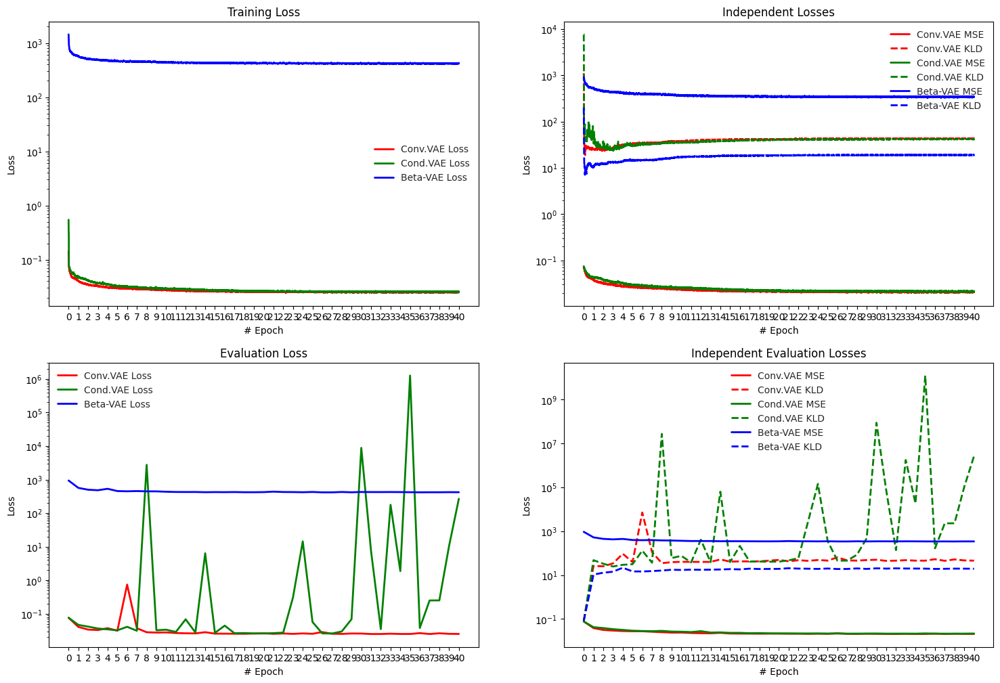

In [9]:
fig, ax = plt.subplots(2,2, figsize=(18,12))
x_ticks_pos = np.arange(0, config['num_iterations']*(config['num_epochs']+1), config['num_iterations'])
x_ticks = np.arange(0,config['num_epochs']+1)

plt.style.use('seaborn-v0_8')

##-- Training PLots --##
smooth_loss = tg.visualization.smooth_curve(convVAE_train_loss, K=51)
ax[0,0].plot(smooth_loss, c="r", label="Conv.VAE Loss", linewidth=2, alpha=1)

smooth_loss = tg.visualization.smooth_curve(condVAE_train_loss, K=51)
ax[0,0].plot(smooth_loss, c="g", label="Cond.VAE Loss", linewidth=2, alpha=1)

smooth_loss = tg.visualization.smooth_curve(betaVAE_train_loss, K=51)
ax[0,0].plot(smooth_loss, c="b", label="Beta-VAE Loss", linewidth=2, alpha=1)

ax[0,0].set_xticks(x_ticks_pos, x_ticks)
ax[0,0].legend(loc="best")
ax[0,0].set_xlabel("# Epoch")
ax[0,0].set_ylabel("Loss")
ax[0,0].set_yscale("log")
ax[0,0].set_title("Training Loss")

smooth_mse = tg.visualization.smooth_curve(convVAE_train_mse, K=31)
smooth_kld = tg.visualization.smooth_curve(convVAE_train_kld, K=31)
ax[0,1].plot(smooth_mse, c="r", label="Conv.VAE MSE", linewidth=2, alpha=1)
ax[0,1].plot(smooth_kld, c="r", linestyle='--', label="Conv.VAE KLD", linewidth=2, alpha=1)

smooth_mse = tg.visualization.smooth_curve(condVAE_train_mse, K=31)
smooth_kld = tg.visualization.smooth_curve(condVAE_train_kld, K=31)
ax[0,1].plot(smooth_mse, c="g", label="Cond.VAE MSE", linewidth=2, alpha=1)
ax[0,1].plot(smooth_kld, c="g", linestyle='--', label="Cond.VAE KLD", linewidth=2, alpha=1)

smooth_mse = tg.visualization.smooth_curve(betaVAE_train_mse, K=31)
smooth_kld = tg.visualization.smooth_curve(betaVAE_train_kld, K=31)
ax[0,1].plot(smooth_mse, c="b", label="Beta-VAE MSE", linewidth=2, alpha=1)
ax[0,1].plot(smooth_kld, c="b", linestyle='--', label="Beta-VAE KLD", linewidth=2, alpha=1)

ax[0,1].set_xticks(x_ticks_pos, x_ticks)
ax[0,1].legend(loc="best")
ax[0,1].set_xlabel("# Epoch")
ax[0,1].set_ylabel("Loss")
ax[0,1].set_yscale("log")
ax[0,1].set_title("Independent Losses")

##-- Evaluation PLots --##
ax[1,0].plot(x_ticks_pos, convVAE_eval_loss, c='r', label="Conv.VAE Loss", linewidth=2, alpha=1)
ax[1,0].plot(x_ticks_pos, condVAE_eval_loss, c='g', label="Cond.VAE Loss", linewidth=2, alpha=1)
ax[1,0].plot(x_ticks_pos, betaVAE_eval_loss, c='b', label="Beta-VAE Loss", linewidth=2, alpha=1)
ax[1,0].set_xticks(x_ticks_pos, x_ticks)
ax[1,0].legend(loc="best")
ax[1,0].set_xlabel("# Epoch")
ax[1,0].set_ylabel("Loss")
ax[1,0].set_yscale("log")
ax[1,0].set_title("Evaluation Loss")

ax[1,1].plot(x_ticks_pos, convVAE_eval_mse, c='r', label="Conv.VAE MSE", linewidth=2, alpha=1)
ax[1,1].plot(x_ticks_pos, convVAE_eval_kld, c='r', linestyle='--', label="Conv.VAE KLD", linewidth=2, alpha=1)
ax[1,1].plot(x_ticks_pos, condVAE_eval_mse, c='g', label="Cond.VAE MSE", linewidth=2, alpha=1)
ax[1,1].plot(x_ticks_pos, condVAE_eval_kld, c='g', linestyle='--', label="Cond.VAE KLD", linewidth=2, alpha=1)
ax[1,1].plot(x_ticks_pos, betaVAE_eval_mse, c='b', label="Beta-VAE MSE", linewidth=2, alpha=1)
ax[1,1].plot(x_ticks_pos, betaVAE_eval_kld, c='b', linestyle='--', label="Beta-VAE KLD", linewidth=2, alpha=1)
ax[1,1].set_xticks(x_ticks_pos, x_ticks)
ax[1,1].legend(loc="best")
ax[1,1].set_xlabel("# Epoch")
ax[1,1].set_ylabel("Loss")
ax[1,1].set_yscale("log")
ax[1,1].set_title("Independent Evaluation Losses")


## Reconstruction Samples

From the reconstruction samples, we can see that our models are not really able to reconstruct the images. The reason for this could be not sufficient model capacity for this rather difficult dataset. In the reconstruction samples we can see that the model is able to reconstruct the basic contours and shapes but fails to propagate any fine-grained details. The convolutional and conditional VAEs perform similar which we already suspected from the training curves. The beta VAE seems to capture less details which we contribute to the heavier regularization through the KL divergence. 

In [11]:
device = 'cuda'

@torch.no_grad()
def visualize_reconstruction(model, conditional=False):
    # Visualize images and their reconstruction
    layout = (4,5)
    num_imgs = layout[0]*layout[1]
    fig = plt.figure(figsize=(30,15))

    figure_grid = GridSpec(layout[0], layout[1], figure=fig)

    model = model.to(device)
    z = torch.zeros((64,512))
    img, label = next(iter(test_loader))
    img, label = img.to(device), label.to(device)
    img_augm, lbl_augm = data_augmentor((img, label))
    if conditional:
        lbl_augm = F.one_hot(lbl_augm, 101)
        recons, (z, mu, sigma) = model(img_augm,lbl_augm)
    else:
        recons, (z, mu, sigma) = model(img_augm)
    print

    model, img, label, recons = model.cpu(), img.cpu(), label.cpu(), recons.cpu()

    img_ind = 0
    for x in range(layout[0]):
        for y in range(layout[1]):
            img_plot = figure_grid[x,y].subgridspec(1,2, wspace=0.1, hspace=0.0)
            ax = fig.add_subplot(img_plot[0])
            ax.imshow(img[img_ind].permute((1,2,0)))
            ax.axis('off')
            ax.set_title('Original')
            ax = fig.add_subplot(img_plot[1])
            ax.imshow(recons[img_ind].permute((1,2,0)))
            ax.axis('off')
            ax.set_title('Reconstructed')
            img_ind += 1

    fig.show()

### Convolutional VAE

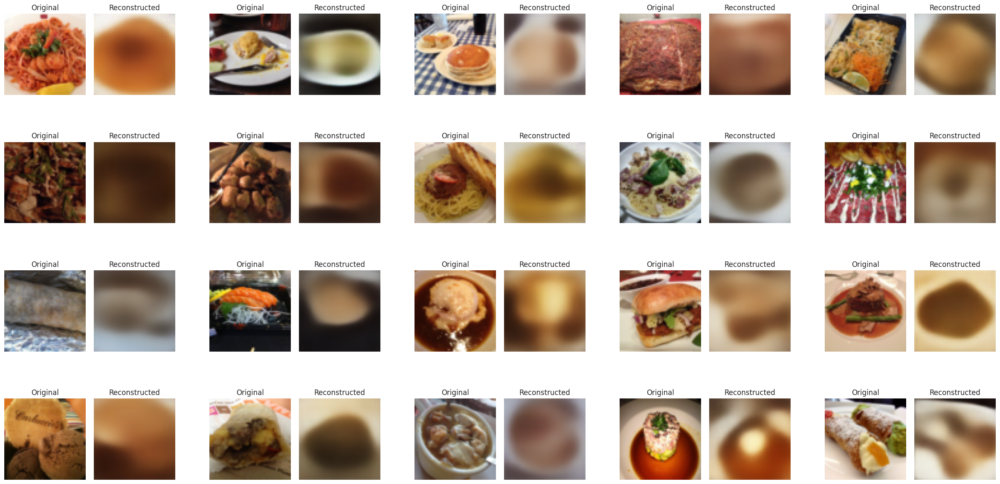

In [12]:
visualize_reconstruction(conv_model)

### Conditional VAE

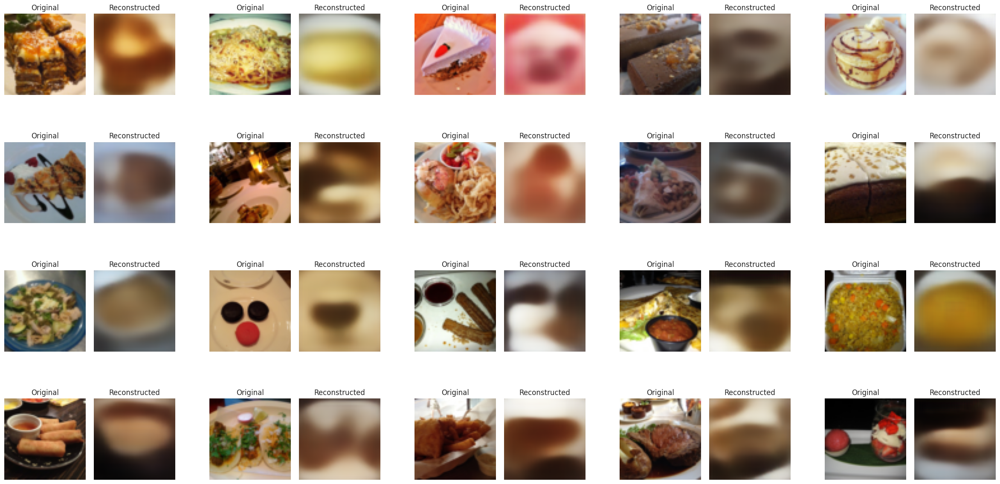

In [13]:
visualize_reconstruction(cond_model, conditional=True)

### Beta VAE

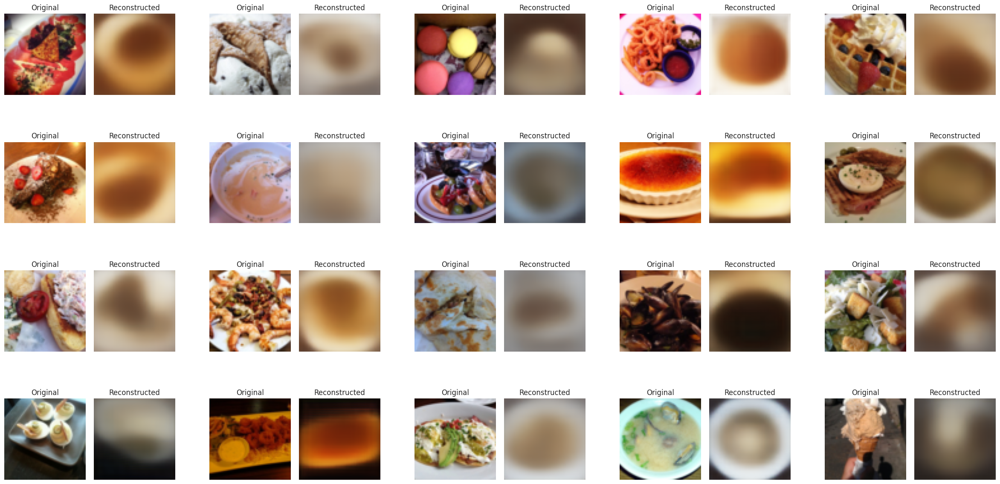

In [14]:
visualize_reconstruction(beta_model)

## Analysis of the Latent Space

Since we project our latent space down to two dimensions it is understandable that we do not see proper cluster in our projections. From the different latent space representations of the models we can not read much. We can see that the the prior assumption of a normal distribution was enforced onto the latent space representation through the KL divergence.

In [15]:
def display_projections(points, labels, ax=None, legend=None):
    """ Displaying low-dimensional data projections """
    
    legend = [f"Class {l}" for l in np.unique(labels)] if legend is None else legend
    if(ax is None):
        _, ax = plt.subplots(1,1,figsize=(12,6))
    
    for i,l in enumerate(np.unique(labels)):
        idx = np.where(l==labels)

        ax.scatter(points[idx, 0], points[idx, 1], label=legend[int(l)])

In [16]:
num_keep = 100
num_iterations = 40
device = 'cuda'

eval_output = {
    'conv_vae': {
        'imgs': [],
        'output': [],
        'labels': [],
        'latents': []
    },
    'cond_vae': {
        'imgs': [],
        'output': [],
        'labels': [],
        'latents': []
    },
    'beta_vae': {
        'imgs': [],
        'output': [],
        'labels': [],
        'latents': []

    },
}

for model, name in [(conv_model, 'conv_vae'), (cond_model, 'cond_vae'), (beta_model, 'beta_vae')]:
    tg.tools.set_random_seed(42)
    progress_bar = tqdm(enumerate(test_loader), total=config['dataset']['test_size']//config['batch_size'])
    model = model.to(device)
    model.eval()
    with torch.no_grad():
        for i, (imgs, lbls) in progress_bar:
            if i==num_iterations:
                break
            imgs = imgs.to(device)
            if name=='cond_vae':
                lbls_augm = F.one_hot(lbls, 101).to(device)
                output, (z, mu, sigma) = model(imgs, lbls_augm)
            else:
                output, (z, mu, sigma) = model(imgs)
            if name=='conv_vae':
                eval_output[name]['imgs'].append(imgs.cpu())
                eval_output[name]['labels'].append(lbls.cpu())

            eval_output[name]['latents'].append(z.cpu())

    model = model.to('cpu')

imgs = torch.flatten(torch.stack(eval_output['conv_vae']['imgs']), start_dim=0, end_dim=1)
labels = torch.flatten(torch.stack(eval_output['conv_vae']['labels']), start_dim=0, end_dim=1)

conv_latents = torch.flatten(torch.stack(eval_output['conv_vae']['latents']), start_dim=0, end_dim=1)
cond_latents = torch.flatten(torch.stack(eval_output['cond_vae']['latents']), start_dim=0, end_dim=1)
beta_latents = torch.flatten(torch.stack(eval_output['beta_vae']['latents']), start_dim=0, end_dim=1)

del eval_output

 10%|█         | 40/394 [00:01<00:17, 20.49it/s]


/tmp/ipykernel_3116934/3555413967.py:11: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1682343995622/work/torch/csrc/utils/tensor_new.cpp:245.)
  ax.scatter(points[idx, 0], points[idx, 1], label=legend[int(l)])


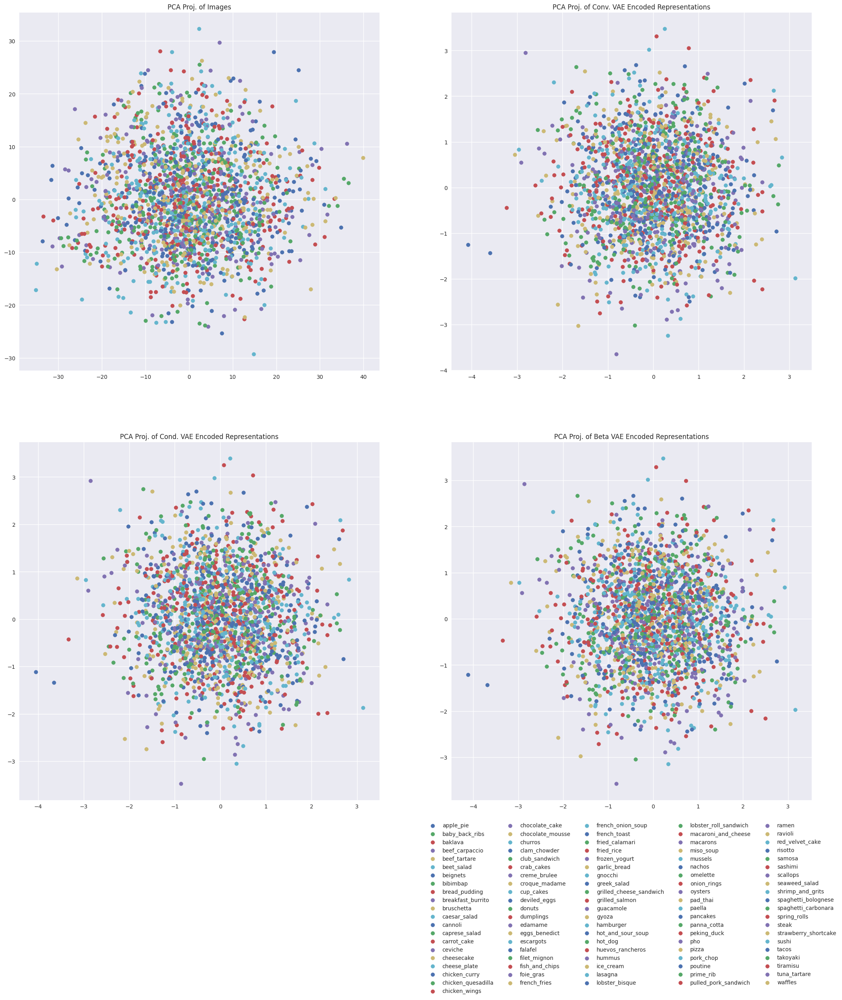

In [17]:
num_display = 2000

pca_imgs = PCA(n_components=2).fit_transform(torch.flatten(imgs, start_dim=1, end_dim=-1))
pca_conv_latents = PCA(n_components=2).fit_transform(conv_latents)
pca_cond_latents = PCA(n_components=2).fit_transform(cond_latents)
pca_beta_latents = PCA(n_components=2).fit_transform(beta_latents)


# N = 2000
fig,ax = plt.subplots(2,2,figsize=(26,26))

display_projections(pca_imgs[:num_display], labels[:num_display], ax=ax[0,0], legend=categories)
ax[0,0].set_title("PCA Proj. of Images")

display_projections(conv_latents[:num_display], labels[:num_display], ax=ax[0,1], legend=categories)
ax[0,1].set_title("PCA Proj. of Conv. VAE Encoded Representations")

display_projections(cond_latents[:num_display], labels[:num_display], ax=ax[1,0], legend=categories)
ax[1,0].set_title("PCA Proj. of Cond. VAE Encoded Representations")

display_projections(beta_latents[:num_display], labels[:num_display], ax=ax[1,1], legend=categories)
ax[1,1].set_title("PCA Proj. of Beta VAE Encoded Representations")


ax[1,1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)
plt.show()

## Interpolation over Latent Space

To interpolate over the latent space we use the PCA projections we produced before. We sample points in the two-dimensional plane in the range pf [-3,3] and then find the k-nearest neighbors in the PCA-projections of the latent space. We take the mean of their latent space representations as our encoding and pass it to the decoder of our model to reconstruct an image.

To interpolate over the latent space we use the previously computed reconstructions of our model and their latent space representation. We uniformly sample 2D points in the PCA-projected latent space. We then find the n-nearest neighbor in the PCA projections of the latent space representations and take the mean between the corresponding latent space representation. In our case only n=1 gave somewhat meaningful results. Still, we can see as we interpolate through the latent space we can not really determine any specific food. Interpolating between two images would give similar blurred results.

In [18]:
@torch.no_grad()
def reproject_pca_to_latent(model, pca_projections, latents, xrange=(-3, 3), yrange=(-2, 2), N=12, n_neighbors=5):
    """
    Sampling equispaced points from the latent space givent the xange and yrange, 
    decoding latents and visualizing distribution of the space
    """
    SIZE = 64
    grid = torch.zeros((3,N*SIZE, N*SIZE))
    model = model.to(device)
    model.eval()
    
    for i, y in enumerate(np.linspace(*yrange, N)):
        for j, x in enumerate(np.linspace(*xrange, N)):
            z = torch.Tensor([[x, y]])
            dist_to_pca = torch.sqrt(((torch.from_numpy(pca_projections) - z)**2).sum(dim=-1))
            _, ind = torch.topk(dist_to_pca, n_neighbors, largest=False)
            reproj_latent = torch.mean(latents[ind], dim=0).to(device)

            x_out = model.decode(reproj_latent).cpu()
            
            grid[:,(N-1-i)*SIZE:(N-i)*SIZE, j*SIZE:(j+1)*SIZE] = x_out.squeeze()

    model = model.cpu()     
    plt.figure(figsize=(16,16))
    plt.imshow(grid.permute(1,2,0), extent=[*yrange, *xrange], cmap="gray")
    plt.axis("off")

@torch.no_grad()
def sample_interpolation(model, p1, p2, N=15):
    """ Sampling N points from the line that connects p1 and p2 """
    
    z = torch.stack([p1 * t + p2 * (1-t) for t in torch.linspace(0, 1, N).to(device)])
    decoded = model.decode(z)
    decoded_imgs = decoded.cpu().view(-1,32,32)
    return decoded_imgs

### Convolutional VAE

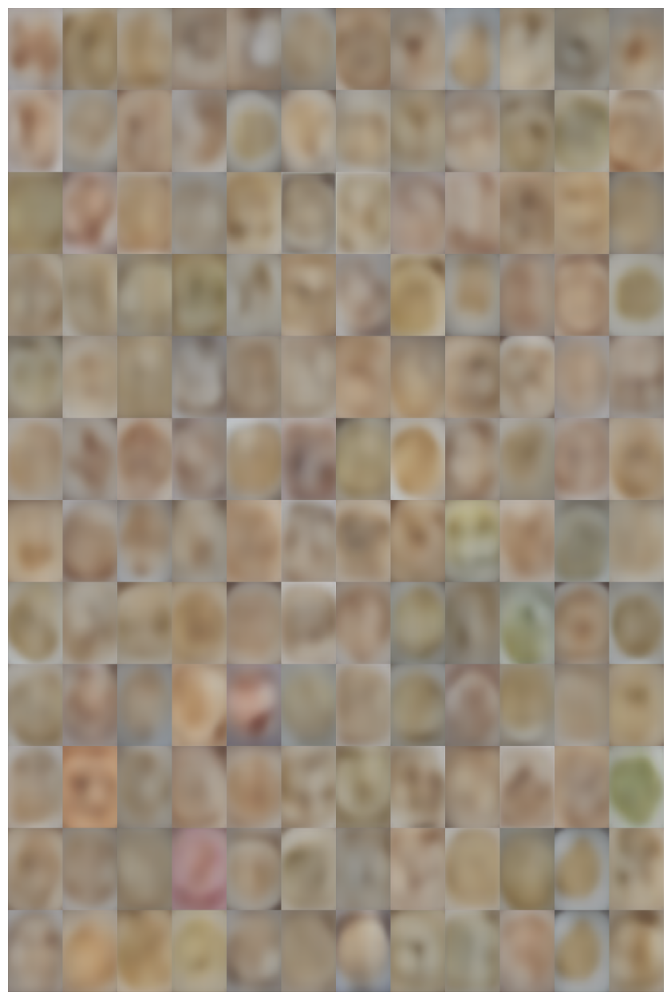

In [19]:
reproject_pca_to_latent(conv_model, pca_conv_latents, conv_latents, n_neighbors=1)

### Beta VAE

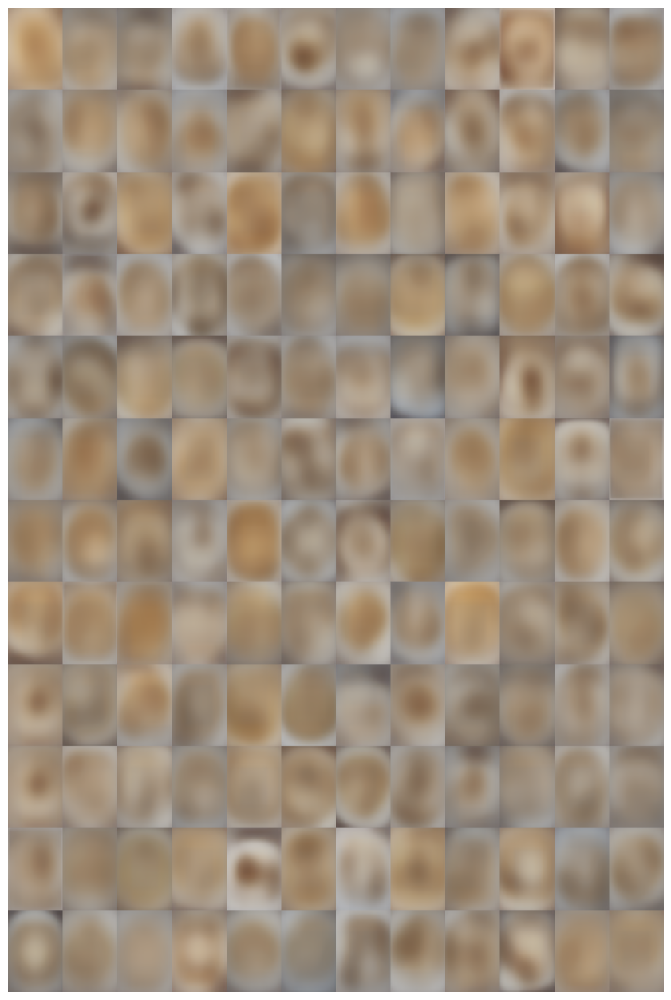

In [20]:
reproject_pca_to_latent(beta_model, pca_beta_latents, beta_latents, n_neighbors=1)


## Sample from Conditional VAE

We can see that the model is at least able to reconstruct the contours of the plates and somewhat the contours of the food with some imagination.

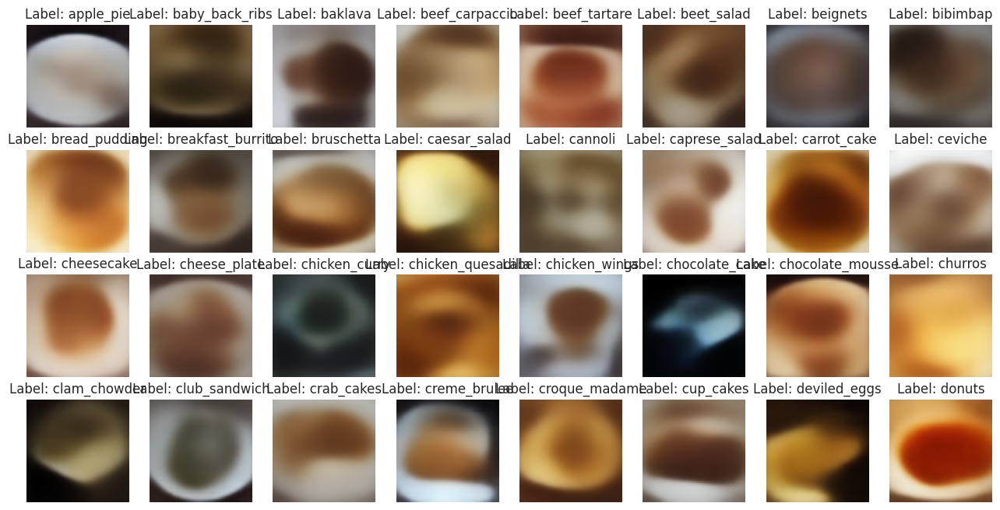

In [24]:
num = 32
layout = (4,8)
fig, ax = plt.subplots(*layout, figsize=(16,8))

cond_model = cond_model.to(device)
labels = torch.eye(101).to(device)[:64]
z = torch.randn((64,512)).float().to(device)

with torch.no_grad():
    recons = cond_model.decode(z, labels).cpu()

cond_model, label = cond_model.cpu(), labels.cpu()

img_ind=0
for x in range(layout[0]):
    for y in range(layout[1]):
        ax[x,y].imshow(recons[img_ind].permute(1,2,0))
        ax[x,y].axis("off")
        ax[x,y].set_title(f"Label: {categories[img_ind]}")

        img_ind += 1

fig.show()

## Fréchet Inception Distance
We decided to take the implementation of the Frechet Inception distance from the TorchMetrics package. The implementation of the function evaluationg the models can be found in `run.py`.

From the scores we can see that the conditional VAE performs slightly better, which we contribute to the fact the the conditional VAE has access to additional information besides the latent vector to reconstruct images. The beta VAE seems to perform worse as we already concluded in the previous steps

In [26]:
convVAE_fid_score = compute_frechet_inception_score(convVAE_exp_name, convVAE_run_name, data_augmentor, conv_model)
condVAE_fid_score = compute_frechet_inception_score(condVAE_exp_name, condVAE_run_name, data_augmentor, cond_model, conditional=True)
betaVAE_fid_score = compute_frechet_inception_score(betaVAE_exp_name, betaVAE_run_name, data_augmentor, beta_model)

pstr = "Frechet Inception Scores:\n"
pstr += f" Conv. VAE: \t {convVAE_fid_score}\n"
pstr += f" Cond. VAE: \t {condVAE_fid_score}\n"
pstr += f" Beta VAE: \t {betaVAE_fid_score}\n"

print(pstr)

100%|██████████| 394/394 [00:27<00:00, 14.36it/s]

Frechet Inception Scores:
 Conv. VAE: 	 3.79019854092961
 Cond. VAE: 	 3.6463737445434337
 Beta VAE: 	 4.350081737876543

